In [1]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from typing import List
np.set_printoptions(threshold=np.inf)  

from fragment import *
from side import *
from sides_comparison import *
from utils import *
from puzzle import *
import global_values
from displaying import *
from assembled_groups import *


In [2]:
image_path = "disney_puzzle/aladin.jpg" 
# image_path = "angry.jpg"
output_folder = "fragments"
global_values.COL_NR = 20
global_values.ROW_NR = 20
fragments, tile_h, tile_w = divide_image(image_path, output_folder, global_values.COL_NR, global_values.ROW_NR)
global_values.TILE_H = global_values.TILE_W = max(tile_h, tile_w)


100%|██████████| 399/399 [00:18<00:00, 21.21it/s]


new group
new group
new group
new group
new group
new group
new group
new group
new group
new group
adding piece to existing group 0
new group
new group
new group
new group
adding piece to existing group 9
new group
new group
new group
new group
adding piece to existing group 17
adding piece to existing group 4
new group
new group
adding piece to existing group 19
new group
new group
new group
adding piece to existing group 22
new group
adding piece to existing group 3
new group
new group
new group
new group
new group
adding piece to existing group 2
adding piece to existing group 9
------------------------------trying to paste group----------------------------------------------------------
anchor group: 9 pasted group: 6
original_first_anchor_row19 original_first_anchor_col 20
original_first_pasted_row19 original_first_pasted_col 19
first_pasted_row20 first_pasted_col 20
moving_dist_row1 moving_dist_col 1
new group
adding piece to existing group 11
adding piece to existing group 2
---

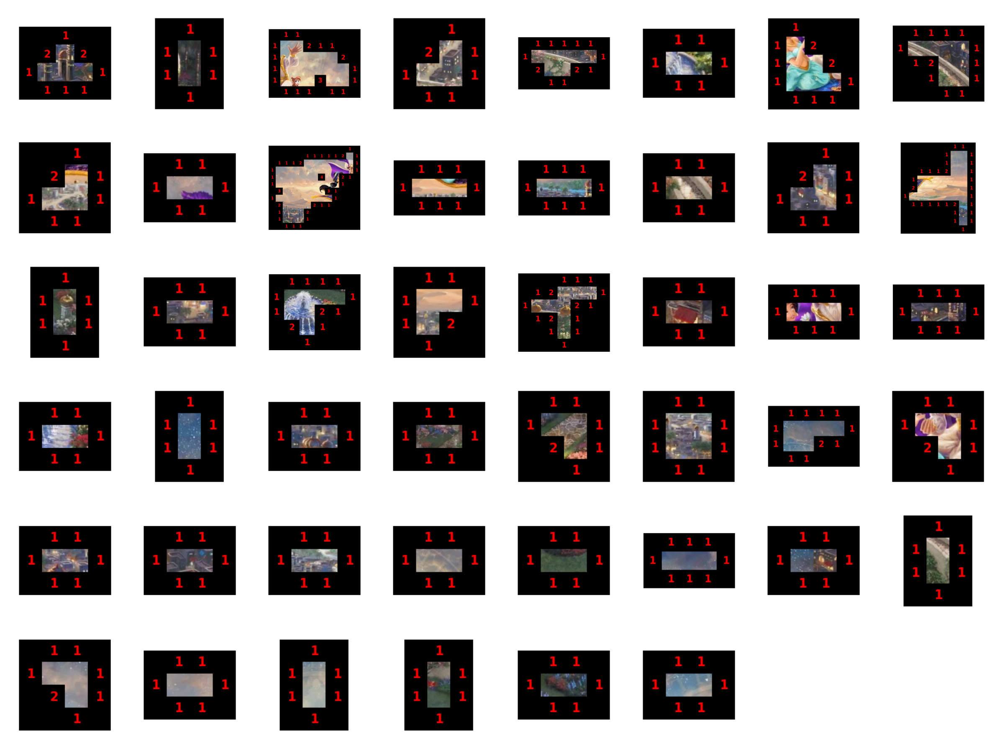

     group_idx  nr_of_neighbours  row  col
0           10                 4   14   24
1            2                 3   21   22
2           10                 3   16   18
3           10                 3   16   25
4            0                 2   19   18
..         ...               ...  ...  ...
395         11                 1   20   21
396         11                 1   20   20
397         11                 1   20   19
398         11                 1   19   22
399         12                 1   20   20

[400 rows x 4 columns]


In [3]:

sides_comparisons = create_sides_comparisons(fragments)
sorted_sides_comparisons = sort_sides_comparisons(sides_comparisons)
# for s in sorted_sides_comparisons:
#     print(f"{s.side1} and {s.side2}")

groups = []
fragment_idx_to_group_idx = [None for fr in fragments]

for s in sorted_sides_comparisons:
    if s.score < 0.08:
        was_change = False

        if fragment_idx_to_group_idx[s.side1.fragment_idx] is not None and fragment_idx_to_group_idx[s.side2.fragment_idx] is not None:
            group_idx1 = fragment_idx_to_group_idx[s.side1.fragment_idx]
            group_idx2 = fragment_idx_to_group_idx[s.side2.fragment_idx]
            if group_idx1 == group_idx2:
                continue

            new_fragment_idx_to_group_idx, new_groups = merge_groups(s,fragments, fragment_idx_to_group_idx, groups, group_idx1, group_idx2)

            if new_fragment_idx_to_group_idx is not None and new_groups is not None:
                fragment_idx_to_group_idx = new_fragment_idx_to_group_idx
                groups = new_groups
                was_change = True

        else:

            if fragment_idx_to_group_idx[s.side1.fragment_idx] is None and fragment_idx_to_group_idx[s.side2.fragment_idx] is None:
                print("new group")
                if check_if_two_fragments_are_vertical(s):
                    new_group = assembledGroup(s)
                    groups.append(new_group)
                    fragment_idx_to_group_idx[s.side1.fragment_idx] = len(groups)-1
                    fragment_idx_to_group_idx[s.side2.fragment_idx] = len(groups)-1
                    was_change = True

            else:
                for group_idx, group in enumerate(groups):
                    if (
                        s.side1.fragment_idx in group.used_fragments and fragment_idx_to_group_idx[s.side2.fragment_idx] is None
                    ):
                        print(f"adding piece to existing group {group_idx}")
                        if group.add_fragment(fragments, s.side1, s.side2):
                            fragment_idx_to_group_idx[s.side2.fragment_idx] = group_idx
                            was_change = True
                    elif (
                        s.side2.fragment_idx in group.used_fragments and fragment_idx_to_group_idx[s.side1.fragment_idx] is None
                    ):
                        print(f"adding piece to existing group {group_idx}")
                        if group.add_fragment(fragments, s.side2, s.side1):
                            fragment_idx_to_group_idx[s.side1.fragment_idx] = group_idx
                            was_change = True
    
    # if was_change:
        # print("--------------------------------------------------------------------")
        # print(f"{s.side1} and {s.side2}\n\n")
    #     for group_idx, group in enumerate(groups):
    #         print(f"group fragments: {group.used_fragments}")
    #         print(f"group positions: {group.fragment_positions}")
    #         group.show(fragments)

groups_img = []
for group_idx, group in enumerate(groups):
    print(f"group {group_idx}")
    print(f"group fragments: {group.used_fragments}")
    print(f"group positions: {group.fragment_positions}")
    group.nr_of_neighbours_grid()
    gr_img = group.show_no_background(fragments, 1)
    groups_img.append(gr_img)


show_all_groups(groups_img)

edges_of_groups_df = edges_of_groups(groups)
print(edges_of_groups_df)

In [4]:
n = len(fragments)
s = 4  
comparisons = [[[[None for _ in range(s)] for _ in range(s)] for _ in range(n)] for _ in range(n)]
for c in sides_comparisons:
    comparisons[c.side1.fragment_idx][c.side2.fragment_idx][c.side1.side_idx][c.side2.side_idx] = c
    comparisons[c.side2.fragment_idx][c.side1.fragment_idx][c.side2.side_idx][c.side1.side_idx] = c
    
# for fr_idx1 in range(n):
#     print(f"comparisons to fragment {fr_idx1}")
#     for fr_idx2 in range(n):
#         for side1 in range(s):
#             for side2 in range(s):
#                 comp = comparisons[fr_idx1][fr_idx2][side1][side2]
#                 if comp is not None:
#                     print(comp)  

def get_comparison(frag1, frag2, side1, side2):
    comp = comparisons[frag1][frag2][side1][side2]
    if comp is None:
        comp = comparisons[frag2][frag1][side2][side1]  
    return comp

for c in sides_comparisons:
    print(f"fr1: {c.side1.fragment_idx}, side1: {c.side1.side_idx} -> fr2: {c.side2.fragment_idx}, side2: {c.side2.side_idx}")


fr1: 0, side1: 0 -> fr2: 1, side2: 2
fr1: 0, side1: 0 -> fr2: 2, side2: 2
fr1: 0, side1: 0 -> fr2: 3, side2: 2
fr1: 0, side1: 0 -> fr2: 4, side2: 2
fr1: 0, side1: 0 -> fr2: 5, side2: 2
fr1: 0, side1: 0 -> fr2: 6, side2: 2
fr1: 0, side1: 0 -> fr2: 7, side2: 2
fr1: 0, side1: 0 -> fr2: 8, side2: 2
fr1: 0, side1: 0 -> fr2: 9, side2: 2
fr1: 0, side1: 0 -> fr2: 10, side2: 2
fr1: 0, side1: 0 -> fr2: 11, side2: 2
fr1: 0, side1: 0 -> fr2: 12, side2: 2
fr1: 0, side1: 0 -> fr2: 13, side2: 2
fr1: 0, side1: 0 -> fr2: 14, side2: 2
fr1: 0, side1: 0 -> fr2: 15, side2: 2
fr1: 0, side1: 0 -> fr2: 16, side2: 2
fr1: 0, side1: 0 -> fr2: 17, side2: 2
fr1: 0, side1: 0 -> fr2: 18, side2: 2
fr1: 0, side1: 0 -> fr2: 19, side2: 2
fr1: 0, side1: 0 -> fr2: 20, side2: 2
fr1: 0, side1: 0 -> fr2: 21, side2: 2
fr1: 0, side1: 0 -> fr2: 22, side2: 2
fr1: 0, side1: 0 -> fr2: 23, side2: 2
fr1: 0, side1: 0 -> fr2: 24, side2: 2
fr1: 0, side1: 0 -> fr2: 25, side2: 2
fr1: 0, side1: 0 -> fr2: 26, side2: 2
fr1: 0, side1: 0 -> f

In [5]:
anchor_group_idx = edges_of_groups_df["group_idx"][0]
empty_row = edges_of_groups_df["row"][0]
empty_col = edges_of_groups_df["col"][0]
top_fragment_idx = None
bottom_fragment_idx = None
left_fragment_idx = None
right_fragment_idx = None

nr_of_neighbours = groups[anchor_group_idx].neighbours_grid[empty_row][empty_col]

if groups[anchor_group_idx].grid[empty_row - 1][empty_col] is not None:
    top_fragment_idx = groups[anchor_group_idx].grid[empty_row - 1][empty_col]

if groups[anchor_group_idx].grid[empty_row + 1][empty_col] is not None:
    bottom_fragment_idx = groups[anchor_group_idx].grid[empty_row + 1][empty_col]

if groups[anchor_group_idx].grid[empty_row][empty_col - 1] is not None:
    left_fragment_idx = groups[anchor_group_idx].grid[empty_row][empty_col - 1]

if groups[anchor_group_idx].grid[empty_row][empty_col + 1] is not None:
    right_fragment_idx = groups[anchor_group_idx].grid[empty_row][empty_col + 1]

print(f"anchor group idx: {anchor_group_idx} with space at {empty_row} {empty_col}")
print(f"left: {left_fragment_idx} right: {right_fragment_idx} top: {top_fragment_idx} bottom: {bottom_fragment_idx}")
print(f"nr of neighbours: {nr_of_neighbours}")


fragments_compatibility_for_empty_spot = np.zeros(n)
for fr_idx in range(len(fragments)):
    if top_fragment_idx is not None and top_fragment_idx == fr_idx or bottom_fragment_idx is not None and bottom_fragment_idx == fr_idx or \
    left_fragment_idx is not None and left_fragment_idx == fr_idx or right_fragment_idx is not None and right_fragment_idx == fr_idx:
        continue

    if top_fragment_idx is not None:
        fragments_compatibility_for_empty_spot[fr_idx] += get_comparison(top_fragment_idx, fr_idx, 2, 0).score 
    if bottom_fragment_idx is not None:
        fragments_compatibility_for_empty_spot[fr_idx] += get_comparison(bottom_fragment_idx,fr_idx,0,2).score 
    if left_fragment_idx is not None:
        fragments_compatibility_for_empty_spot[fr_idx] += get_comparison(left_fragment_idx,fr_idx,1,3).score 
    if right_fragment_idx is not None:
        fragments_compatibility_for_empty_spot[fr_idx] += get_comparison(right_fragment_idx,fr_idx,3,1).score 


    # if top_fragment_idx is not None:
    #     print(get_comparison(top_fragment_idx, fr_idx, 2, 0))
    # if bottom_fragment_idx is not None:
    #     print(get_comparison(bottom_fragment_idx,fr_idx,0,2))
    # if left_fragment_idx is not None:
    #     print(get_comparison(left_fragment_idx,fr_idx,1,3))
    # if right_fragment_idx is not None:
    #     print(get_comparison(right_fragment_idx,fr_idx,3,1))
print(fragment_idx_to_group_idx)

anchor group idx: 10 with space at 14 24
left: 105 right: 107 top: 86 bottom: 126
nr of neighbours: 4
[None, 25, None, 37, 37, 37, None, 25, None, 15, None, None, None, None, 30, 30, 30, 30, None, None, None, None, None, None, None, 40, 40, None, None, None, None, None, None, None, 30, 30, None, None, None, 38, None, None, None, None, None, None, 40, None, 9, 9, 10, None, 45, 45, 42, None, 35, 35, None, None, 41, 41, None, None, 10, 10, 10, 10, 10, 10, 10, None, 2, 2, 42, None, None, None, None, None, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, None, 2, 2, 2, 2, 2, None, 15, 15, 10, 10, 10, 10, 10, 10, None, 10, 10, 22, 22, 22, 2, 2, 2, 2, 2, 2, 15, 15, 10, 10, 10, 10, 10, 10, 10, 10, 10, 6, 31, 31, 2, 2, 2, None, 2, 2, 15, 15, None, 10, 10, 10, 10, 10, 10, None, None, 6, 6, 31, None, None, 15, 15, 15, 15, 15, 15, 10, 10, 10, 10, 10, 10, 10, 10, None, 6, 6, 6, None, None, 15, 15, 15, 15, 15, 15, None, 10, 10, 10, 10, 19, 19, 11, 11, 11, 8, None, None, 15, 15, 15, 15, 15, 15, 15, None, 

In [6]:
#  masura de performanta
# greedy -> contrangeri
# piese rotite
# similaritate cu retea
